In [2]:
import os
import pickle

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# import seaborn as sns
# sns.set_context('notebook')
from sklearn.neighbors import DistanceMetric
from PIL import Image
import matplotlib.ticker as ticker

from sklearn.decomposition import IncrementalPCA


In [3]:
from sklearn.neighbors import NearestNeighbors

In [4]:
def find_neighbours(X, query_index, n_neighbors=36, metric='manhattan'):
    nbrs = NearestNeighbors(n_neighbors=n_neighbors, algorithm='ball_tree', metric=metric).fit(X)
    _, indices = nbrs.kneighbors(X[query_index].reshape(1, -1))
    return indices

In [5]:
def show_galaxies(df, n_galaxies=36, label=None):
    if n_galaxies == 8:
        fig, all_axes = plt.subplots(1, 8, figsize=(20, 3.5))
    elif n_galaxies == 11:
        fig, all_axes = plt.subplots(1, 11, figsize=(20, 4.5))
    elif n_galaxies == 12:
        fig, axes = plt.subplots(2, 6, figsize=(20, 7))
        all_axes = [ax for row in axes for ax in row]
    else:
        fig, axes = plt.subplots(6, 6, figsize=(20, 20))
        all_axes = [ax for row in axes for ax in row]
    for ax_n, ax in enumerate(all_axes):
        im = Image.open(df.iloc[ax_n]['png_loc'])
        
        crop_pixels = 120
        initial_size = 424 # assumed, careful
        (left, upper, right, lower) = (crop_pixels, crop_pixels, initial_size-crop_pixels, initial_size-crop_pixels)
        im = im.crop((left, upper, right, lower))

        ax.imshow(np.array(im))
        
        if ax_n == 0:
            ax.patch.set_edgecolor('green')  
            ax.patch.set_linewidth('14')  
            # can't just disable axis as also disables border, do manually instead
            ax.xaxis.set_major_locator(ticker.NullLocator())
            ax.xaxis.set_minor_locator(ticker.NullLocator())
            ax.yaxis.set_major_locator(ticker.NullLocator())
            ax.yaxis.set_minor_locator(ticker.NullLocator())
            if label:
                ax.set_ylabel(label, labelpad=7, fontsize=14)
        else:
            ax.axis('off')
            
    fig.tight_layout(pad=1.)
    
    return fig

In [6]:
df = pd.read_parquet('/media/walml/beta1/cnn_features/decals/dr5_b0_full_features_and_safe_catalog.parquet')

In [11]:
df['png_loc']

0         /media/walml/beta1/decals/png_native/dr5/J000/...
1         /media/walml/beta1/decals/png_native/dr5/J000/...
2         /media/walml/beta1/decals/png_native/dr5/J000/...
3         /media/walml/beta1/decals/png_native/dr5/J000/...
4         /media/walml/beta1/decals/png_native/dr5/J000/...
                                ...                        
305652    /media/walml/beta1/decals/png_native/dr5/J235/...
305653    /media/walml/beta1/decals/png_native/dr5/J235/...
305654    /media/walml/beta1/decals/png_native/dr5/J235/...
305655    /media/walml/beta1/decals/png_native/dr5/J235/...
305656    /media/walml/beta1/decals/png_native/dr5/J235/...
Name: png_loc, Length: 305657, dtype: object

In [33]:
wrong_size = pd.read_parquet('/home/walml/repos/zoobot_private/gz_decals_volunteers_auto_posteriors_wrongsize.parquet', columns=['iauname', 'wrong_size_statistic', 'wrong_size_warning'])

In [34]:
print(len(df))
df = pd.merge(df, wrong_size, on='iauname', how='inner')
print(len(df))

305657
273722


In [35]:
df = df[~df['wrong_size_warning']]

In [36]:
feature_cols = [col for col in df if col.startswith('feat')]

In [37]:

def get_embed(features, n_components, save=''):
    embedder = IncrementalPCA(n_components=n_components)
    embed = embedder.fit_transform(features) 
     # no train/test needed as unsupervised
    if len(save) > 0:
        plt.plot(embedder.explained_variance_)  # 5 would probably do?
        plt.savefig(save)
        plt.close()
    return embed

In [38]:
features = df[feature_cols].values

In [39]:
# X = get_embed(features, n_components=10)

In [40]:
# with open('pc10_embed_for_similarity_nb.pickle', 'wb') as f:
#     pickle.dump(X, f)

In [41]:
with open('pc10_embed_for_similarity_nb.pickle', 'rb') as f:
    embed = pickle.load(f)

In [42]:
# interesting_index = np.argmax(df['iauname'] == 'J000115.60-034919.9')
# df.iloc[interesting_index]

In [43]:
# indices = find_neighbours(features, interesting_index, metric='euclidean')
# show_galaxies(df.iloc[np.squeeze(indices)], n_galaxies=12)  # first is itself

In [44]:
# indices = find_neighbours(embed, interesting_index, metric='euclidean')
# show_galaxies(df.iloc[np.squeeze(indices)])  # first is itself

In [45]:
tags = pd.read_csv('/home/walml/repos/recommender_hack/tags_for_shoaib.csv')  # bit old now

In [46]:
print(len(tags))
tags = tags[tags['iauname'].isin(df['iauname'])]
print(len(tags))

110764
93900


In [65]:
pairs_to_replace = [
    ('star-forming', 'starforming'),
    ('starburst', 'starforming'),
    ('starformation', 'starforming'),
    ('dust-lane', 'dustlane'),
    ('dust', 'dustlane'),
    ('dusty', 'dustlane'),
    ('edge-on', 'edgeon'),
    ('seyfert-1-galaxy', 'seyfert-1'),
    ('interaction', 'interacting'),
    ('overlapping-object', 'overlap'),
    ('overlapping', 'overlap'),
    ('central-core', 'core'),
    ('ringed', 'ring'),
    ('wrong_size', 'wrong-size'),
    ('tidal-debris', 'tidal'),
    ('objects_that_need_more_research', 'need_more_research')
]

for pair in pairs_to_replace:
    tags['tag'] = tags['tag'].replace(*pair)

In [66]:
tags['tag'].value_counts()[:40]  # ring tag stats TODO

starforming             14878
spiral                   6819
agn                      6212
disturbed                3455
ring                     3022
edgeon                   2487
overlap                  2433
merger                   2186
bar                      2087
dustlane                 1897
barred-spiral            1842
decals                   1662
sdss                     1586
irregular                1450
tidal                     862
asteroid                  824
elliptical                773
seyfert-1                 552
broadline                 542
merging                   542
spiral2                   517
hot                       499
h-alpha-peak              481
wrong-size                420
interacting               416
lenticular                409
infra-red-source          402
galaxy                    399
artifact                  383
core                      381
diffuse                   346
emission-line-galaxy      330
need_more_research        322
liner-type

In [67]:
tags['tag'].value_counts()[40:80]

fuzzy-disk            261
clumpy                249
barred                245
seyfert-2             238
group                 237
red-galaxy            237
seyfert-2-galaxy      233
smooth                225
disk                  213
ansae                 212
radio-source          206
overlapping-star      201
blue                  197
qso                   196
fuzzy                 194
spiral-2              184
disturbance           183
faint                 183
green                 180
interesting           174
tidal-tail            169
foreground-star       167
lenticular-galaxy     166
debris                165
bulge                 163
beautiful             163
lens                  161
type-s                158
overlapping-galaxy    158
lenticular_lens       157
foreground-stars      156
scattered-galaxies    154
phys560               152
type-sc               151
weak-bar              150
melting               150
bright-core           149
type-sbc              149
star-burst  

In [68]:
top_tags = list(tags['tag'].value_counts()[:60].index)
# top_tags

In [69]:
wavelength_tags = ['agn', 'seyfert-1', 'infra-red-source', 'liner-type-agn', 'radio_galaxy', 'seyfert-2', 'seyfert-2-galaxy', 'red-galaxy', 'radio-source', 'blue', 'green', 'qso', 'emission-line-galaxy', 'radio-galaxy', 'h-alpha-peak', 'broadline']
question_tags = ['spiral', 'edgeon', 'elliptical', 'merger', 'bar', 'barred-spiral', 'merging', 'spiral2', 'spiral-2', 'strong-bar', 'barred', 'smooth', 'disk', 'disturbance']
metadata_tags = ['decals', 'sdss', 'galaxy']
duplicate_tags = ['fuzzy', 'overlapping-star', 'main-belt']

tags_to_skip = wavelength_tags + question_tags + metadata_tags + duplicate_tags

In [70]:
relevant_tags = [t for t in top_tags if t not in tags_to_skip]
relevant_tags

['starforming',
 'disturbed',
 'ring',
 'overlap',
 'dustlane',
 'irregular',
 'tidal',
 'asteroid',
 'hot',
 'wrong-size',
 'interacting',
 'lenticular',
 'artifact',
 'core',
 'diffuse',
 'need_more_research',
 'barlens',
 'star',
 'fuzzy-spiral',
 'fuzzy-disk',
 'clumpy',
 'group',
 'ansae',
 'faint',
 'interesting']

In [71]:
tag_counts = {}
top_iauname = {}
for tag in relevant_tags:
    tag_counts[tag] = tags.groupby('iauname').agg({'tag': lambda x: np.sum([t == tag for t in x])}).reset_index()
    if tag == 'diffuse' or tag == 'asteroid':
        index = -2  # -1 happens to be a bad example, and has same count (2) as many others
    else:
        index = -1
    top_iauname[tag] = tag_counts[tag].sort_values('tag').iloc[index]['iauname']

In [72]:
tag_counts['diffuse'].sort_values('tag', ascending=False)

,iauname,tag
21935,J133721.97+021950.8,2
24909,J145127.14+125152.9,2
28160,J235437.31-000501.5,2
14797,J112223.18+130440.1,2
12121,J103443.69+161342.9,2
...,...,...
9422,J095630.95+081040.3,0
9421,J095629.19+004232.0,0
9420,J095628.30+001102.3,0
9419,J095627.38+005553.9,0


In [73]:
n_galaxies = 11

/home/walml/anaconda3/envs/zoobot/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """
/home/walml/anaconda3/envs/zoobot/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """
/home/walml/anaconda3/envs/zoobot/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too muc

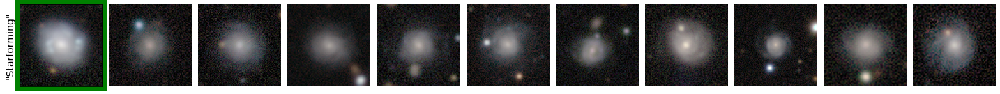

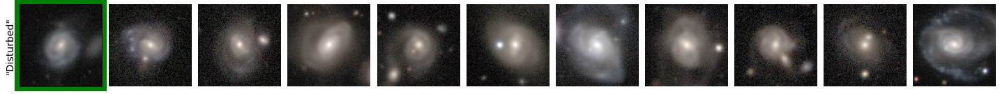

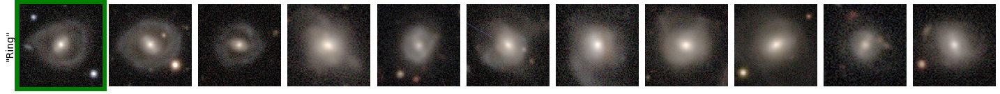

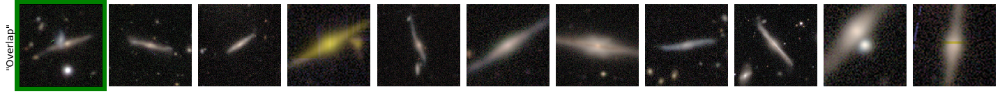

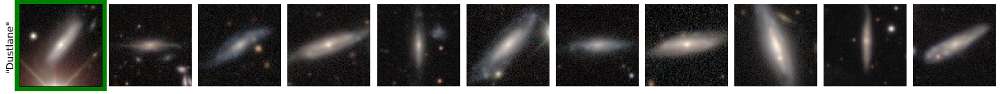

...

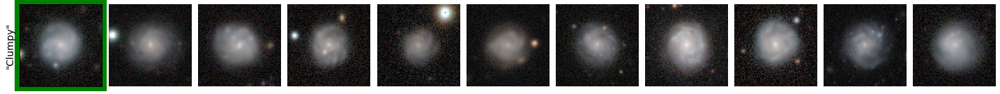

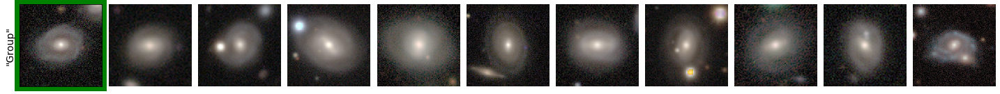

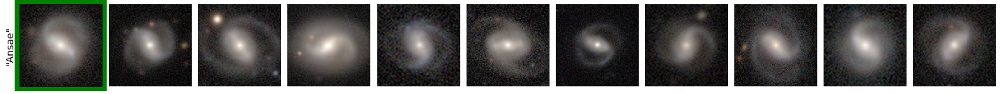

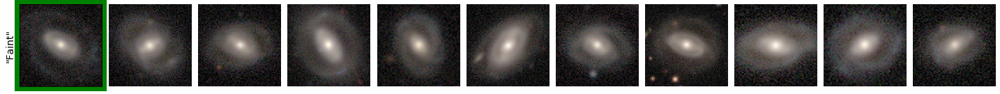

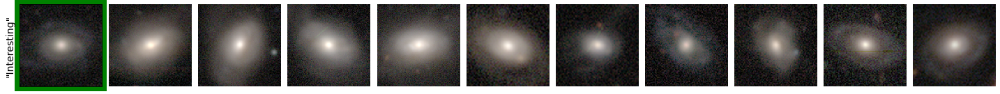

In [74]:
for tag_n, tag in enumerate(relevant_tags):
    galaxy_index = np.argmax(df['iauname'] == top_iauname[tag])
    assert galaxy_index # != 0
    indices = find_neighbours(embed, galaxy_index, metric='euclidean')
    tag_label = f'"{tag.capitalize()}"'.replace('-', ' ').replace('_', ' ')
    fig = show_galaxies(df.iloc[np.squeeze(indices)], n_galaxies=n_galaxies, label=tag_label)  # first is itself
    fig.savefig(f'similar/pca10/similar_{tag_n}_tag_{tag}_n{n_galaxies}_pca10_talk.png'.format(n_galaxies))
#     fig.savefig(f'similar/features/similar_tag_{tag}_n{n_galaxies}_features.png'.format(n_galaxies))
#     plt.close()

In [30]:
assert False

AssertionError: 

In [ ]:
indices = find_neighbours(embed, np.argmax(df['iauname'] == top_iauname['starforming']), metric='euclidean')
show_galaxies(df.iloc[np.squeeze(indices)], n_galaxies=n_galaxies, label=f'"{tag.capitalize()}"')  # first is itself

In [ ]:
indices = find_neighbours(embed, np.argmax(df['iauname'] == top_iauname['agn']), metric='euclidean')
show_galaxies(df.iloc[np.squeeze(indices)], n_galaxies=n_galaxies)  # first is itself

In [ ]:
indices = find_neighbours(embed, np.argmax(df['iauname'] == top_iauname['starburst']), metric='euclidean')
show_galaxies(df.iloc[np.squeeze(indices)], n_galaxies=n_galaxies)  # first is itself

In [ ]:
indices = find_neighbours(embed, np.argmax(df['iauname'] == top_iauname['disturbed']), metric='euclidean')
show_galaxies(df.iloc[np.squeeze(indices)], n_galaxies=n_galaxies)  # first is itself

In [ ]:
indices = find_neighbours(embed, np.argmax(df['iauname'] == top_iauname['ring']), metric='euclidean')
show_galaxies(df.iloc[np.squeeze(indices)], n_galaxies=n_galaxies)  # first is itself

In [ ]:
indices = find_neighbours(embed, np.argmax(df['iauname'] == top_iauname['overlap']), metric='euclidean')
show_galaxies(df.iloc[np.squeeze(indices)], n_galaxies=n_galaxies)  # first is itself

In [ ]:
indices = find_neighbours(embed, np.argmax(df['iauname'] == top_iauname['irregular']), metric='euclidean')
show_galaxies(df.iloc[np.squeeze(indices)], n_galaxies=n_galaxies)  # first is itself

In [ ]:
indices = find_neighbours(embed, np.argmax(df['iauname'] == top_iauname['dustlane']), metric='euclidean')
show_galaxies(df.iloc[np.squeeze(indices)], n_galaxies=n_galaxies)  # first is itself

In [ ]:
indices = find_neighbours(embed, np.argmax(df['iauname'] == top_iauname['asteroid']), metric='euclidean')
show_galaxies(df.iloc[np.squeeze(indices)], n_galaxies=n_galaxies)  # first is itself

In [ ]:
psb_name = 'J124354.11+163250.5'  # in decals but not that 30k

In [ ]:
pca_10[interesting_index]

In [ ]:
X = pca_10

In [ ]:
indices = find_neighbours(X, interesting_index)
show_galaxies(df.iloc[np.squeeze(indices)])  # first is itself

In [ ]:
not_hoag = "J120143.46+001059.2"
not_hoag_index = np.argmax(df['iauname'] == not_hoag)

In [ ]:
indices = find_neighbours(X, not_hoag_index, metric='euclidean')
show_galaxies(df.iloc[np.squeeze(indices)])  # first is itself

In [ ]:
overlap = "J114222.33+084611.5"
overlap_index = np.argmax(df['iauname'] == overlap)
indices = find_neighbours(X, overlap_index)
show_galaxies(df.iloc[np.squeeze(indices)])  # first is itself